In [8]:
import xarray as xr 
import datetime
import cartopy
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import os
import seaborn as sns
from ascat.cgls import SWI_TS
import matplotlib.pyplot as plt
import glob
import numpy as np
from shapely.geometry import mapping
import rioxarray as rxr
import xarray as xr
import geopandas as gpd
import pytesmo.timedate.dekad as dkd
import pytesmo.time_series.anomaly as tsa
import pytesmo.scaling as sc
import geopandas as gpd
from osgeo import ogr
import pandas as pd
import warnings
import pygeogrids.netcdf as nc
import pygeogrids
from pynetcf.time_series import GriddedNcOrthoMultiTs
import sys
import pytesmo.temporal_matching as temp_match
import matplotlib as mpl
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pynetcf.time_series import OrthoMultiTs
def smapi(df):
    df.loc[:,'smapi']=(df['abs']-df.abs_m)/(df.abs_m)*100
    df.loc[:,'smapi_mapped'] = pd.cut(df.smapi, bins = [-100,-30,-15,-5, 5, 15,30,100], \
                                       labels=['extremely dry', 'moderate dry','dry','normal', 'wet', 'moderately wet','extremely wet'])
    return df[['smapi', 'smapi_mapped']]

def zscore(df):
    df.loc[:,'zscore'] = (df.anom-df.anom_m)/(df.anom_std)
    df.loc[:,'zscore_mapped'] = pd.cut(df.zscore, bins = [-5,-3,-2,-1,1,2,3,5],\
                                       labels=['extremely dry', 'moderately dry','dry','normal','wet','moderately wet','extremely wet'])
    return df[['zscore', 'zscore_mapped']]

def qanom(df):
    df.loc[:,'qanom'] = pd.qcut(df.anom,[0., 0.05, 0.1,0.2,0.8,0.9, 0.95, 1.],\
                   labels=[0,5,10,20,80,90,95],duplicates='drop')
    
    df.loc[:, 'qanom_mapped'] = pd.qcut(df.anom,[0, 0.05, 0.1,0.2,0.8,0.9, 0.95,  1.],\
                   labels=['extremely dry','moderately dry','dry','normal','wet','moderately wet','extremely wet'],duplicates='drop')
    return df[['qanom', 'qanom_mapped']]
warnings.filterwarnings('ignore')
data_path = os.path.join(os.getenv("HOME"),'ESMCA')
name='GTM'
fname=os.path.join(data_path, 'gadm41_{:}_shp'.format(name), 'gadm41_{:}_0.shp'.format(name))
adm0_shapes = gpd.read_file(fname)
fname=os.path.join(data_path, 'gadm41_{:}_shp'.format(name), 'gadm41_{:}_1.shp'.format(name))
adm1_shapes = gpd.read_file(fname)
fname2=os.path.join(data_path, 'gadm41_{:}_shp'.format(name), 'gadm41_{:}_2.shp'.format(name))
adm2_shapes = gpd.read_file(fname2)
sns.set(context='paper')
plot_crs = cartopy.crs.Mercator()
data_crs = cartopy.crs.PlateCarree()
extent=adm0_shapes.geometry.bounds.values

fname=os.path.join(data_path, 'gadm41_{:}_shp'.format(name), 'gadm41_{:}_1.shp'.format(name))
adm1_list = list(shpreader.Reader(fname).geometries())
fname=os.path.join(data_path, 'gadm41_{:}_shp'.format(name), 'gadm41_{:}_0.shp'.format(name))
adm0_list = list(shpreader.Reader(fname).geometries())

rd = SWI_TS(os.path.join(data_path, 'SWI_TS'))
modisgrid = nc.load_grid(os.path.join(data_path,'MODIS','grid.nc'))
mr=GriddedNcOrthoMultiTs(os.path.join(data_path,'MODIS'), modisgrid)
lut = rd.grid.calc_lut(modisgrid)
eragrid = nc.load_grid(os.path.join(data_path,'ERA5','grid.nc'))
er=GriddedNcOrthoMultiTs(os.path.join(data_path,'ERA5'), eragrid)
lutera = rd.grid.calc_lut(eragrid)
filelist=glob.glob(os.path.join(data_path, 'C3S', 'images','*.nc'))
stack = xr.open_mfdataset(filelist, engine='rasterio', chunks={}, combine='nested', concat_dim='time').sortby('time')
c3s_stack=stack.sel(x=slice(-95,-87),
                    y=slice(19,12))  
c3s=c3s_stack['sm'].compute()

ds=xr.open_dataset(os.path.join(data_path, '0-ERA5_LAND.swvl1_with_1-ASCAT.sm_with_2-SMAP_L3.soil_moisture_with_3-ESA_CCI_SM_passive.sm.nc'))


In [9]:
fname=os.path.join(data_path, 'gadm41_{:}_shp'.format(name), 'gadm41_{:}_0.shp'.format(name))
drv = ogr.GetDriverByName("ESRI Shapefile")
ds_in = drv.Open(fname)
lyr_in = ds_in.GetLayer(0)
for feature in lyr_in:
    ply = feature.GetGeometryRef()
    grid=rd.grid.get_shp_grid_points(ply)

dt = rd.read(-90,15).index
dtm = mr.read(-90,15).index
dte = er.read(-90,15).index


In [88]:
dfsl[10:13]

,c3s_slope,hsaf_slope,era_slope,lon,lat
787236,-0.000017,0.000008,0.000004,-90.602257,14.014973
787240,-0.000018,0.000015,0.000004,-90.717972,14.014973
787244,-0.000006,0.000017,0.000002,-90.833679,14.014973


In [ ]:
import pytesmo.metrics as metrics
import pytesmo.scaling as scaling
dfsl=pd.DataFrame(index=grid.activegpis, columns=['c3s_slope', 'hsaf_slope', 'era_slope'])
dfc=pd.DataFrame(index=grid.activegpis, columns=['c3s_r', 'hsaf_r', 'c3s_snr', 'hsaf_snr', 'c3s_rmsd', 'hsaf_rmsd'])
eragpi_old=-10
for gpi in grid.activegpis:
    try:
        print (gpi)
        lon,lat=grid.gpi2lonlat(gpi)
        ts = rd.read(gpi).dropna(subset='SWI_001')
        df = ts.resample('m').mean()

        eragpi=lutera[gpi]
        if eragpi!=eragpi_old:
            eragpi_old=eragpi
            tse = er.read(eragpi).dropna(subset='swvl1')['2007':'2022']
            df.loc[:,'era']=tse.resample('m').mean()['swvl1']
            tsc = c3s.sel(x=lon,y=lat, method='nearest').to_dataframe()
            tsc.index=tsc.index.to_datetimeindex()
            tsc.loc[(tsc.sm<0)|(tsc.sm>1),'sm']=np.NaN
            tsc = tsc.dropna(subset='sm')['2007':'2022']
            df.loc[:,'c3s']=tsc.resample('m').mean()['sm']
            df.loc[:,'c3s']=scaling.mean_std(df.c3s,df.era)
        df.loc[:,'swi']=scaling.mean_std(df.SWI_001,df.era)
        df = df.dropna(subset=['c3s','era','swi'])
        jd = df.index.to_julian_date()
        dfsl.loc[gpi,'hsaf_slope'] = np.polyfit(jd, df.swi.values, 1)[0]
        dfsl.loc[gpi,'era_slope'] = np.polyfit(jd, df.era.values, 1)[0]
        dfsl.loc[gpi,'c3s_slope'] = np.polyfit(jd, df.c3s.values, 1)[0]

        corr=df.corr()
        dfc.loc[gpi,'c3s_r']=corr['c3s']['era']
        dfc.loc[gpi,'hsaf_r']=corr['swi']['era']      
        dfc.loc[gpi,'hsaf_rmsd']=metrics.ubrmsd(df.era.astype(float).values,df.swi.astype(float).values)
        dfc.loc[gpi,'c3s_rmsd']=metrics.ubrmsd(df.era.astype(float).values,df.c3s.astype(float).values)
        snr=metrics.tcol.tcol_metrics(df.era.astype(float).values,df.c3s.astype(float).values,df.swi.astype(float).values, [0])
        dfc.loc[gpi,'c3s_snr'] = snr[0][1]
        dfc.loc[gpi,'hsaf_snr'] = snr[0][2]
    except:
        continue
dfsl.loc[:,'lon']=grid.arrlon
dfsl.loc[:,'lat']=grid.arrlat

774768
780994
780998
781002
781006
787216
787220
787224
787228
787232
787236
787240
787244
787248
787252
787256
787260
787264
793438
793442
793446
793450
793454
793458
793462
793466
793470
793474
793478
793482
793486
793490
799656
799660
799664
799668
799672


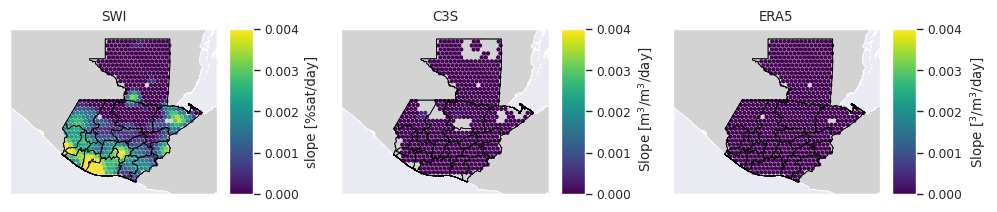

In [45]:
sns.set_context('paper')
fig, (ax1,ax,ax2) = plt.subplots(nrows=1,ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(12,7), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85, wspace=0.6)

ax.set_title('C3S')
ax.add_geometries(adm0_list, data_crs,
                  edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    facecolor='lightgray'),zorder=0)
ax.add_geometries(adm1_list, data_crs,
                      edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])

var = dfsl['c3s_slope'].values

sc = ax.scatter(dfsl['lon'], dfsl['lat'], c=var, zorder=1,
                   transform=data_crs, cmap='viridis',vmin=0, vmax=0.004,s=5)

cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label(r' Slope [m$^3$/m$^3$/day]')

ax1.set_title('SWI')
ax1.add_geometries(adm0_list, data_crs,
                  edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
ax1.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    facecolor='lightgray'),zorder=0)
ax1.add_geometries(adm1_list, data_crs,
                      edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
# ax.add_geometries(adm2_shapes, data_crs,
#                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
ax1.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
ax1.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])

var = dfsl['hsaf_slope'].values

sc = ax1.scatter(dfsl['lon'], dfsl['lat'], c=var, zorder=1,
                   transform=data_crs, vmin=0, vmax=0.004, cmap='viridis',s=5)

cax = fig.add_axes([ax1.get_position().x1+0.01, ax1.get_position().y0,
                    0.02, ax1.get_position().height])

cbar = fig.colorbar(sc, ax=ax1, cax=cax)
cbar.set_label('slope [%sat/day]')

ax2.set_title('ERA5')
ax2.add_geometries(adm0_list, data_crs,
                  edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
ax2.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    facecolor='lightgray'),zorder=0)
ax2.add_geometries(adm1_list, data_crs,
                      edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
ax2.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
ax2.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])

var = dfsl['era_slope'].values

sc = ax2.scatter(dfsl['lon'], dfsl['lat'], c=var, zorder=1,
                   transform=data_crs, cmap='viridis',vmin=0, vmax=0.004,s=5)

cax = fig.add_axes([ax2.get_position().x1+0.01, ax2.get_position().y0,
                    0.02, ax2.get_position().height])

cbar = fig.colorbar(sc, ax=ax2, cax=cax)
cbar.set_label('Slope [$^3$/m$^3$/day]')

plt.savefig(os.path.join(data_path, "slope_gpis.png"), dpi=300)

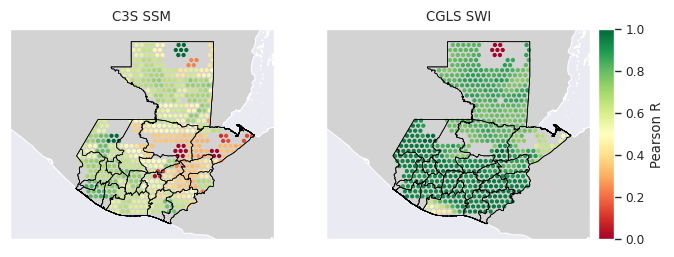

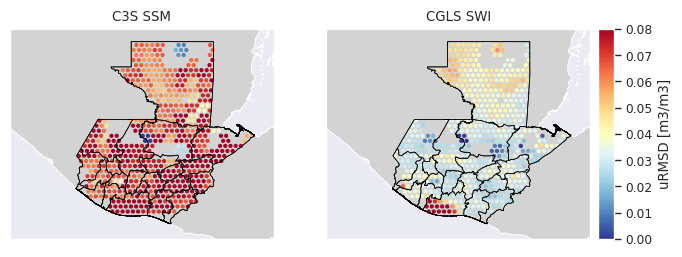

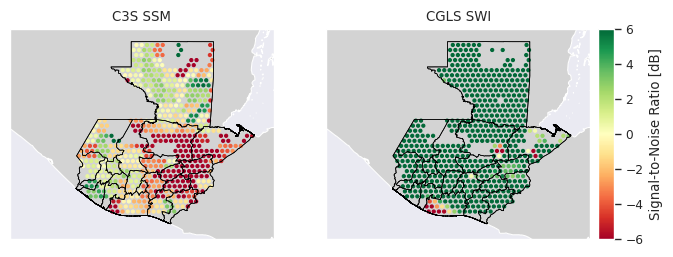

In [62]:
sns.set(context='paper')
plot_crs = cartopy.crs.Mercator()
data_crs = cartopy.crs.PlateCarree()
name='GTM'

fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(8,5), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85)
key1=[x for x in dfc if x.endswith('_r')]
key2=[x for x in dfc if x.endswith('_rmsd')]
key3=[x for x in dfc if x.endswith('_snr')]
names=['C3S SSM', 'CGLS SWI']
for ax,key,name in zip(axs.flatten(),key1,names):
    ax.set_title(name)
    ax.add_geometries(adm0_list, data_crs,
                      edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
    #
    ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        facecolor='lightgray'),zorder=0)

    ax.add_geometries(adm1_list, data_crs,
                          edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
    # ax.add_geometries(adm2_shapes, data_crs,
    #                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
    ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
    ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])


    var = dfc[key].values
    sc = ax.scatter(dfc['lon'], dfc['lat'], c=var, zorder=1,
                       transform=data_crs, vmin=0, vmax=1, cmap='RdYlGn',s=5)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label('Pearson R')

plt.savefig(os.path.join(data_path, "hsaf_pearson_r.png"), dpi=300)
fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(8,5), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85)

for ax,key, name in zip(axs.flatten(),key2,names):
    ax.set_title(name)
    ax.add_geometries(adm0_list, data_crs,
                      edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
    #
    ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        facecolor='lightgray'),zorder=0)

    ax.add_geometries(adm1_list, data_crs,
                          edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
    # ax.add_geometries(adm2_shapes, data_crs,
    #                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
    ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
    ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])


    var = dfc[key].values
    sc = ax.scatter(dfc['lon'], dfc['lat'], c=var, zorder=1,
                       transform=data_crs, vmin=0, vmax=0.08, cmap='RdYlBu_r',s=5)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label('uRMSD [m3/m3]')

plt.savefig(os.path.join(data_path, "urmsd.png"), dpi=300)


fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(8,5), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85)

for ax,key, name in zip(axs.flatten(),key3,names):
    ax.set_title(name)
    ax.add_geometries(adm0_list, data_crs,
                      edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
    #
    ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        facecolor='lightgray'),zorder=0)

    ax.add_geometries(adm1_list, data_crs,
                          edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
    # ax.add_geometries(adm2_shapes, data_crs,
    #                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
    ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
    ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])


    var = dfc[key].values
    sc = ax.scatter(dfc['lon'], dfc['lat'], c=var, zorder=1, vmin=-6, vmax=6,
                       transform=data_crs, cmap='RdYlGn',s=5)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label('Signal-to-Noise Ratio [dB]')

plt.savefig(os.path.join(data_path, "dB.png"), dpi=300)

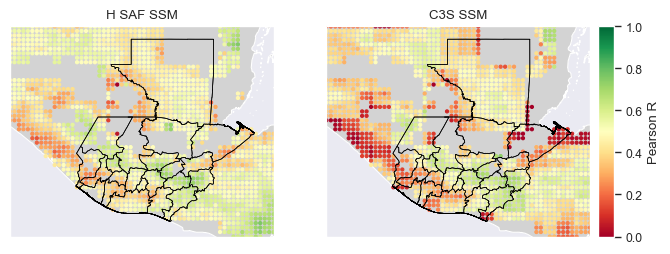

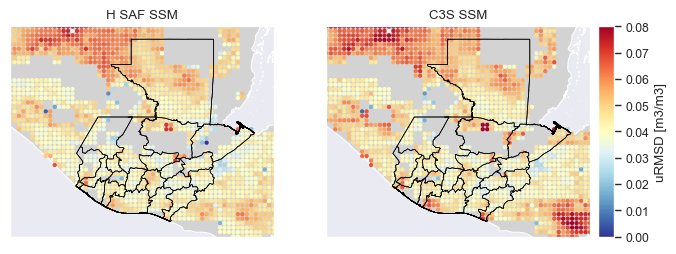

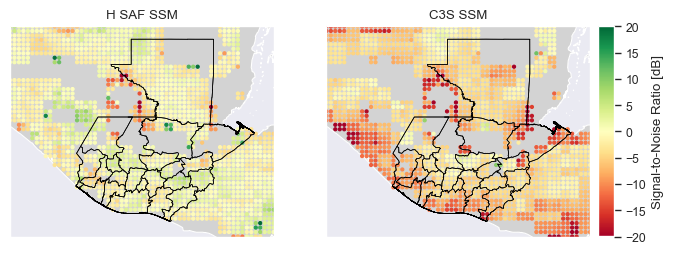

In [10]:
sns.set(context='paper')
plot_crs = cartopy.crs.Mercator()
data_crs = cartopy.crs.PlateCarree()
name='GTM'

fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(8,5), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85)
key1=[x for x in ds if x.startswith('R_between')]
key2=[x for x in ds if x.startswith('urmsd_between')]
names=['CGLS SWI', 'C3S SSM']
for ax,key,name in zip(axs.flatten(),key1,names):
    ax.set_title(name)
    ax.add_geometries(adm0_list, data_crs,
                      edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
    #
    ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        facecolor='lightgray'),zorder=0)

    ax.add_geometries(adm1_list, data_crs,
                          edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
    # ax.add_geometries(adm2_shapes, data_crs,
    #                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
    ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
    ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])


    var = ds[key].values
    sc = ax.scatter(ds['lon'], ds['lat'], c=var, zorder=1,
                       transform=data_crs, vmin=0, vmax=1, cmap='RdYlGn',s=5)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label('Pearson R')

plt.savefig(os.path.join(data_path, "hsaf_pearson_r.png"), dpi=300)
fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(8,5), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85)

for ax,key, name in zip(axs.flatten(),key2,names):
    ax.set_title(name)
    ax.add_geometries(adm0_list, data_crs,
                      edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
    #
    ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        facecolor='lightgray'),zorder=0)

    ax.add_geometries(adm1_list, data_crs,
                          edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
    # ax.add_geometries(adm2_shapes, data_crs,
    #                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
    ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
    ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])


    var = ds[key].values
    sc = ax.scatter(ds['lon'], ds['lat'], c=var, zorder=1,
                       transform=data_crs, vmin=0, vmax=0.08, cmap='RdYlBu_r',s=5)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label('uRMSD [m3/m3]')

plt.savefig(os.path.join(data_path, "urmsd.png"), dpi=300)


fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(8,5), sharex=True, sharey=True)
plt.subplots_adjust(right=0.85)
key3=['snr_1-ASCAT_between_0-ERA5_LAND_and_1-ASCAT_and_3-ESA_CCI_SM_passive',
      'snr_3-ESA_CCI_SM_passive_between_0-ERA5_LAND_and_1-ASCAT_and_3-ESA_CCI_SM_passive']
for ax,key, name in zip(axs.flatten(),key3,names):
    ax.set_title(name)
    ax.add_geometries(adm0_list, data_crs,
                      edgecolor='black',linewidth=0.5, facecolor='none', alpha=1.0,zorder=2)
    #
    ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                        facecolor='lightgray'),zorder=0)

    ax.add_geometries(adm1_list, data_crs,
                          edgecolor='black', facecolor='none', linewidth=0.5, alpha=1.0,zorder=2)
    # ax.add_geometries(adm2_shapes, data_crs,
    #                   edgecolor='black',linewidth=0.5, facecolor='none', alpha=0.7,zorder=2)
    ax.add_feature(cartopy.feature.LAND, facecolor='#aaaaaa')
    ax.set_extent([ds['lon'].min().values, ds['lon'].max().values, ds['lat'].min().values, ds['lat'].max().values])


    var = ds[key].values
    sc = ax.scatter(ds['lon'], ds['lat'], c=var, zorder=1, vmin=-20, vmax=20,
                       transform=data_crs, cmap='RdYlGn',s=5)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0,
                    0.02, ax.get_position().height])

cbar = fig.colorbar(sc, ax=ax, cax=cax)
cbar.set_label('Signal-to-Noise Ratio [dB]')

plt.savefig(os.path.join(data_path, "dB.png"), dpi=300)

In [99]:
adm1_shapes.loc[adm1_shapes.NAME_1==NAME_1]

,GID_1,GID_0,COUNTRY,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,ISO_1,geometry
21,GTM.22_1,GTM,Guatemala,Zacapa,NA,NA,Departamento,Department,NA,GT.ZA,GT-19,"POLYGON ((-89.70374 14.75191, -89.72665 14.740..."


In [6]:
lon,lat=np.meshgrid(c3s_stack.x, c3s_stack.y)
c3sgrid=pygeogrids.BasicGrid(lat.flatten(), lon.flatten())

warnings.filterwarnings('ignore')
dt = rd.read(-90,15).index
dtm = mr.read(-90,15).index
dtc = c3s.sel(x=-90,y=15, method='nearest').to_dataframe().index.to_datetimeindex()
dfd = pd.DataFrame(index=dt, columns=pd.MultiIndex.from_product([['min', 'median', 'max','nobs'],adm1_shapes.NAME_1.values]))
dfd2 = pd.DataFrame(index=dtm, columns=pd.MultiIndex.from_product([['min', 'median', 'max','nobs'],adm1_shapes.NAME_1.values]))
dfd3 = pd.DataFrame(index=dt, columns=pd.MultiIndex.from_product([['min', 'median', 'max','nobs'],adm1_shapes.NAME_1.values]))
dfd4 = pd.DataFrame(index=dtc, columns=pd.MultiIndex.from_product([['min', 'median', 'max','nobs'],adm1_shapes.NAME_1.values]))

drv = ogr.GetDriverByName("ESRI Shapefile")
ds_in = drv.Open(fname)
lyr_in = ds_in.GetLayer(0)
for feature in lyr_in:
    ply = feature.GetGeometryRef()
    sgrid=rd.grid.get_shp_grid_points(ply)
    dataset = np.empty((len(dt),len(sgrid.activegpis)))
    dataset20 = np.empty((len(dt),len(sgrid.activegpis)))
    mdataset = np.empty((len(dtm),len(sgrid.activegpis)))
    cdataset = np.empty((len(dtc),len(sgrid.activegpis)))
    dataset[:,:]=np.NaN
    dataset20[:,:]=np.NaN
    mdataset[:,:]=np.NaN
    cdataset[:,:]=np.NaN
    NAME_1 = feature.GetField('Name_1')
    for ix, gpi in enumerate(sgrid.activegpis):
        try:
            lon,lat=sgrid.gpi2lonlat(gpi)
            mpt=Point(modisgrid.gpi2lonlat(lut[gpi]))
            sts = rd.read(gpi)
            dataset[:,ix]=sts.SWI_001.values
            dataset20[:,ix]=sts.SWI_020.values            
            dataset[(dataset<0)|(dataset>100)] = np.NaN
            dataset20[(dataset20<0)|(dataset20>100)] = np.NaN
            sc3s=c3s.sel(x=lon,y=lat, method='nearest')
#             pt=Point(sc3s.x, sc3s.y)
#             if adm1_shapes.loc[adm1_shapes.NAME_1==NAME_1].geometry.contains(pt)[0]:
            cdataset[:,ix]=sc3s.to_dataframe()['sm']
            cdataset[(cdataset<0)|(cdataset>100)] = np.NaN

            mdataset[:,ix]=mr.read(lut[gpi]).LAI.values
            mdataset[(mdataset<0)|(mdataset>10)] = np.NaN
        except:
            continue
    drf=pd.DataFrame(cdataset)
    cdataset=drf.transpose().drop_duplicates().transpose().values
    drf=pd.DataFrame(mdataset)
    mdataset=drf.transpose().drop_duplicates().transpose().values
    dfd.loc[:,('min',NAME_1)] =np.nanmin(dataset,axis=1)
    dfd.loc[:,('median',NAME_1)] =np.nanmedian(dataset,axis=1)
    dfd.loc[:,('max',NAME_1)] =np.nanmax(dataset,axis=1)
    dfd.loc[:,('nobs',NAME_1)] = np.count_nonzero(~np.isnan(dataset),axis=1)
    dfd3.loc[:,('min',NAME_1)] =np.nanmin(dataset20,axis=1)
    dfd3.loc[:,('median',NAME_1)] =np.nanmedian(dataset20,axis=1)
    dfd3.loc[:,('max',NAME_1)] =np.nanmax(dataset20,axis=1)
    dfd3.loc[:,('nobs',NAME_1)] = np.count_nonzero(~np.isnan(dataset20),axis=1)
    dfd2.loc[:,('min',NAME_1)] =np.nanmin(mdataset,axis=1)
    dfd2.loc[:,('median',NAME_1)] =np.nanmedian(mdataset,axis=1)
    dfd2.loc[:,('max',NAME_1)] =np.nanmax(mdataset,axis=1)
    dfd2.loc[:,('nobs',NAME_1)] = np.count_nonzero(~np.isnan(mdataset),axis=1)
    dfd4.loc[:,('min',NAME_1)] =np.nanmin(cdataset,axis=1)
    dfd4.loc[:,('median',NAME_1)] =np.nanmedian(cdataset,axis=1)
    dfd4.loc[:,('max',NAME_1)] =np.nanmax(cdataset,axis=1)
    dfd4.loc[:,('nobs',NAME_1)] = np.count_nonzero(~np.isnan(cdataset),axis=1)

  

warnings.filterwarnings('ignore')
filelist = np.sort(glob.glob('/home/mavl/ESMCA/CHIRPS/*.tif'))
dt=[datetime.datetime.strptime(x[-13:-5]+str(int(x[-5:-4])*7),'%Y.%m.%d') for x in filelist]
name='GTM'

dfr = pd.DataFrame(index=dt, columns=pd.MultiIndex.from_product([['min', 'median', 'max','nobs'],adm1_shapes.NAME_1.values]))
for ix, fname in zip(dt,filelist): 
    dset = rxr.open_rasterio(fname).squeeze()
    for key, df in adm1_shapes.iterrows():
        dataset = dset.rio.clip([df.geometry])
        dfr.loc[ix,('min',df.NAME_1)] =np.nanmin(dataset)
        dfr.loc[ix,('median',df.NAME_1)] =np.nanmedian(dataset)
        dfr.loc[ix,('max',df.NAME_1)] =np.nanmax(dataset)
        dfr.loc[ix,('nobs',df.NAME_1)] =np.count_nonzero(~np.isnan(dataset))

NameError: name 'c3s_stack' is not defined

In [102]:
rf = pd.read_pickle(os.path.join(data_path, 'CHIRPS', 'rf_ds.pkl')).astype('float')
dfd = dfd.resample('m').max()
dfd3 = dfd.resample('m').max()
dfm=temp_match.temporal_collocation(dfd, dfd2.resample('m').max(), window=0.5)
dfr=temp_match.temporal_collocation(dfd, rf.resample('m').cumsum(), window=1)
dfc=temp_match.temporal_collocation(dfd, dfd4.resample('m').max(), window=0.5)
df = dfd.join(dfd3, rsuffix='_swi20')
df = df.join(dfm,rsuffix='_lai').join(dfr,rsuffix='_rf', lsuffix='_swi01').join(dfc, rsuffix='_c3s')
df.to_pickle(os.path.join(data_path, 'ADM2_data_GTM.pkl'))
df.resample('m').mean().to_csv(os.path.join(data_path,'ADM1_data_GTM.csv'))

In [39]:
df = pd.read_pickle(os.path.join(data_path,'ADM2_data_GTM.pkl')).astype(float)
df.xs("Retalhuleu",level=1,axis=1)

,min_swi01,median_swi01,max_swi01,nobs_swi01,min_swi20,median_swi20,max_swi20,nobs_swi20,min_lai,median_lai,max_lai,nobs_lai,min_rf,median_rf,max_rf,nobs_rf,min,median,max,nobs
2007-01-31,24.0,35.00,48.5,12.0,NaN,NaN,NaN,NaN,0.913503,1.436746,2.188314,6.0,0.009228,0.058044,3.309446,66.0,0.315667,0.359111,0.385000,3.666667
2007-02-28,10.5,17.75,45.5,12.0,NaN,NaN,NaN,NaN,0.772725,1.294345,2.158884,6.0,0.242513,1.107809,2.864983,66.0,0.272556,0.321778,0.349333,3.333333
2007-03-31,4.0,10.75,35.5,12.0,NaN,NaN,NaN,NaN,0.724802,1.238549,2.242984,6.0,0.896340,2.051969,7.961118,66.0,0.262556,0.306333,0.321889,3.666667
2007-04-30,8.5,24.00,69.5,12.0,NaN,NaN,NaN,NaN,0.845723,1.406764,2.741604,6.0,13.015645,19.432376,52.336096,66.0,0.307000,0.326000,0.341556,3.333333
2007-05-31,54.5,68.25,81.0,12.0,NaN,NaN,NaN,NaN,1.208280,1.951112,2.984189,5.5,69.029988,121.863032,185.608490,66.0,0.347556,0.370889,0.396111,3.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-28,22.5,35.75,57.5,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.654889,3.799993,14.615594,66.0,0.277775,0.311069,0.342851,4.000000
2022-03-31,27.0,43.00,68.0,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.039440,7.984387,35.357150,66.0,0.303125,0.321917,0.341564,4.000000
2022-04-30,36.0,56.50,78.5,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.179188,15.098716,40.736870,66.0,0.302495,0.324577,0.344390,4.000000
2022-05-31,62.0,86.00,96.0,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.423964,102.971237,204.225095,66.0,0.367587,0.388796,0.410471,4.000000


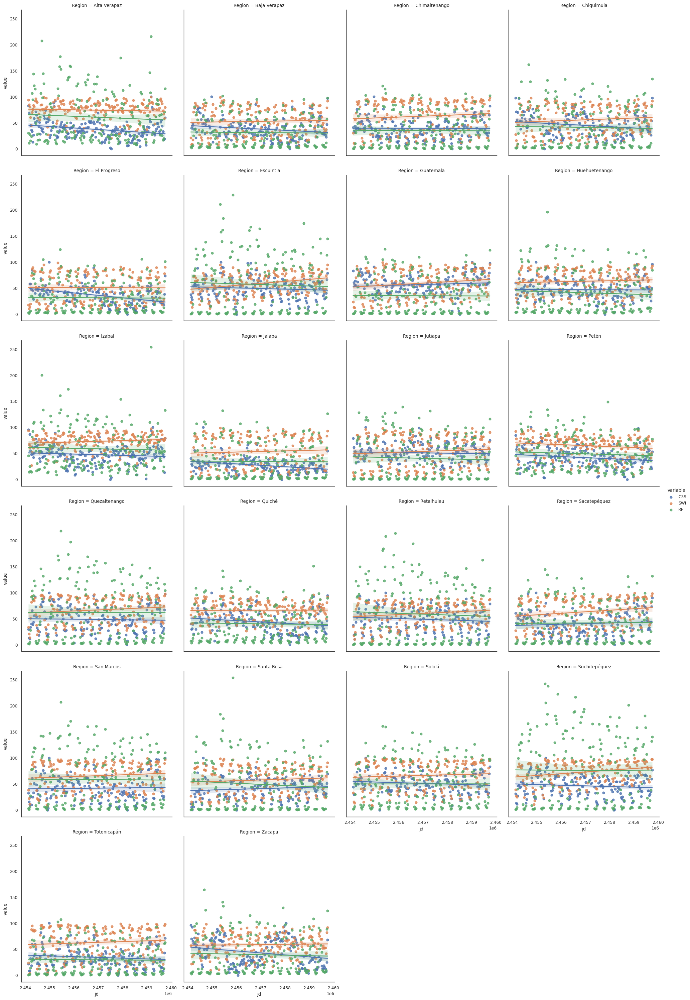

In [35]:
dfsc=pd.DataFrame(columns=['Region', 'SWI','RF','C3S','jd'])
df = pd.read_pickle(os.path.join(data_path,'ADM2_data_GTM.pkl')).astype(float)

slopes = []
c3sslopes = []
rfslopes = []
for key, name in adm1_shapes.iterrows():
    data=df.xs(name.NAME_1, axis=1, level=1)
    data=data.resample('m').agg({'median_rf': np.cumsum, 'median_swi01': np.mean, 'median':np.mean})
    data['median'] = ((data['median']-data['median'].min())/(data['median'].max()-data['median'].min()))*100
    jd = data.index.to_julian_date()
    dtf = pd.DataFrame({'RF':data.median_rf,'SWI':data.median_swi01,'C3S':data['median'],'jd':jd,'Region':name.NAME_1})
    dfsc =pd.concat([dfsc,dtf])
    swifit=np.polyfit(jd, data.median_swi01,1)
    slopes.append(swifit[0])
    data=data.dropna(subset='median')
    jd = data.index.to_julian_date()
    c3sfit=np.polyfit(jd, data['median'],1)
    c3sslopes.append(c3sfit[0])
    rffit=np.polyfit(jd, data['median_rf'],1)
    rfslopes.append(rffit[0])

dfsc=dfsc.melt(value_vars=['C3S','SWI','RF'],id_vars=['Region','jd'])
sns.lmplot(x='jd', y='value',data=dfsc, hue='variable',col='Region',col_wrap=4)

adm1_df=adm1_shapes
adm1_df.loc[:, 'SWI_slope'] = slopes
adm1_df.loc[:, 'C3S_slope'] = c3sslopes
adm1_df.loc[:, 'CHIRPS_slope'] = rfslopes
norm = mcolors.Normalize(vmin=0, vmax=0.004)



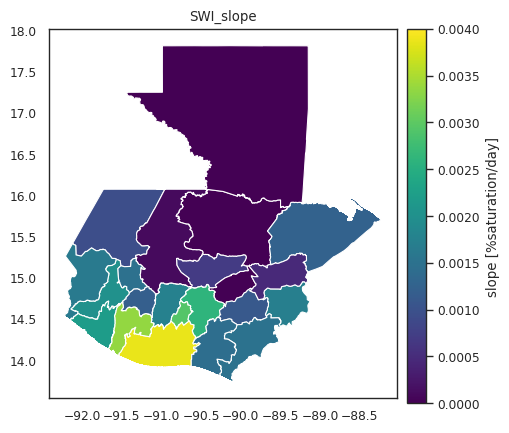

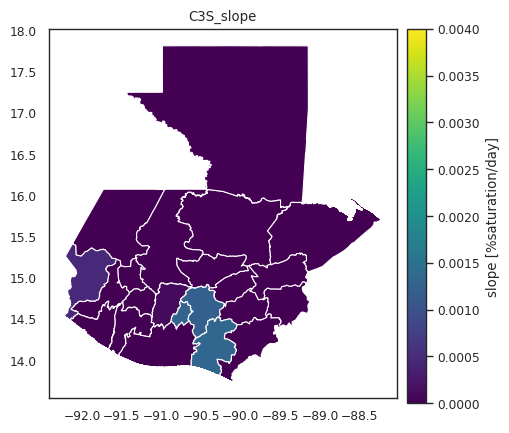

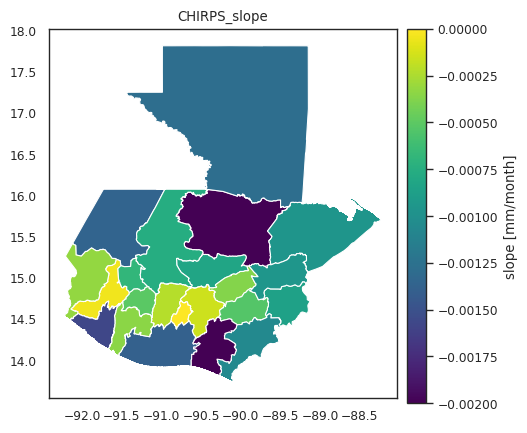

In [36]:
names=['SWI_slope', 'C3S_slope', 'CHIRPS_slope']
labels=['slope [%saturation/day]','slope [%saturation/day]','slope [mm/month]']
sns.set_style('white')
vmins=[0,0,-0.002]
vmaxs=[0.004,0.004, 0]
for label,name, vmin, vmax in zip(labels,names,vmins,vmaxs):
    ax=adm1_df.plot(column=name,vmin=vmin, vmax=vmax,cmap='viridis',legend=False)
    ax.set_title(name)
    fig = ax.get_figure()
    cax = fig.add_axes([0.8, 0.1, 0.03, 0.78])
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # fake up the array of the scalar mappable. Urgh...
    sm._A = []
    cbar=fig.colorbar(sm, cax=cax)
    cbar.set_label(label)
    plt.savefig(os.path.join(data_path,'ADM1_slope_{:}.png'.format(name)),dpi=300)

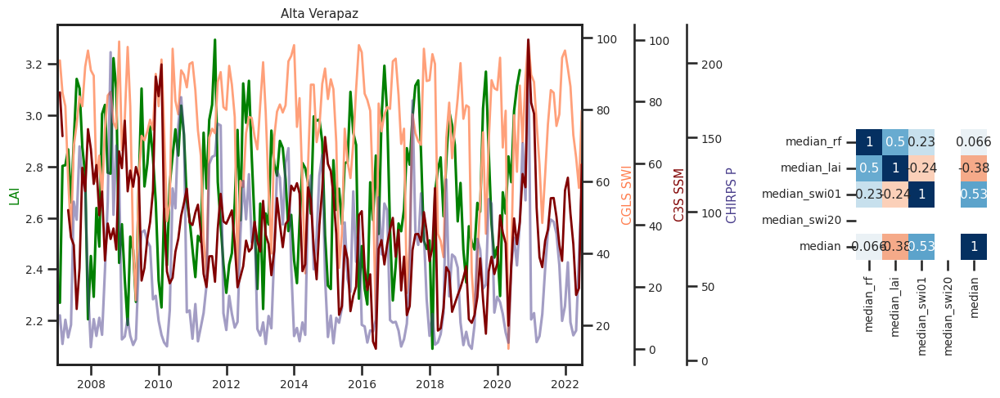

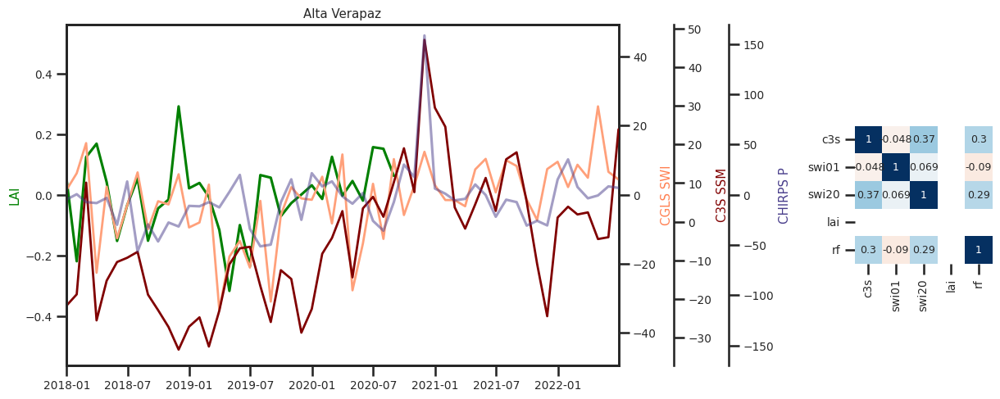

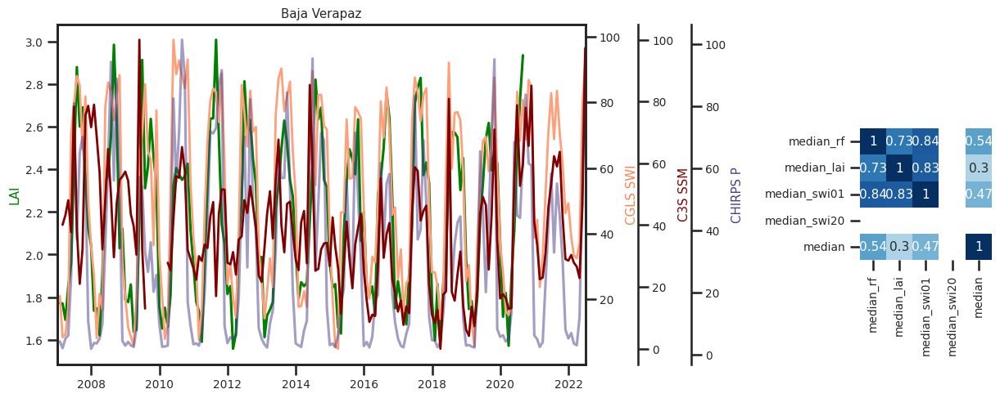

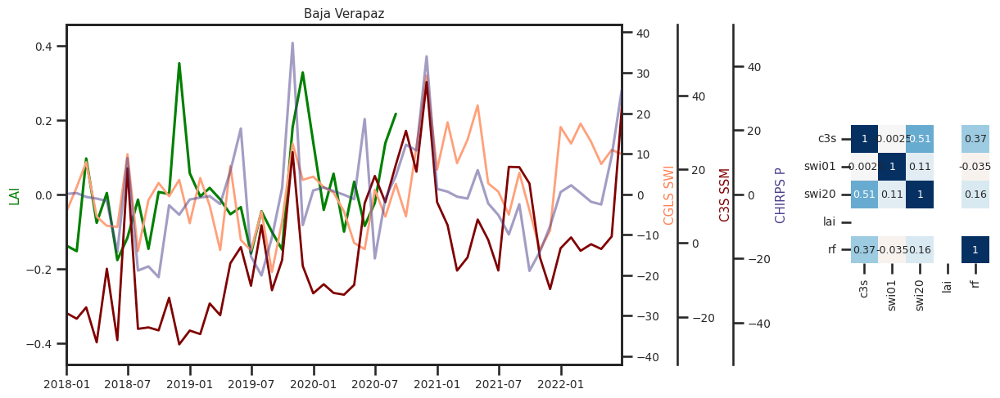

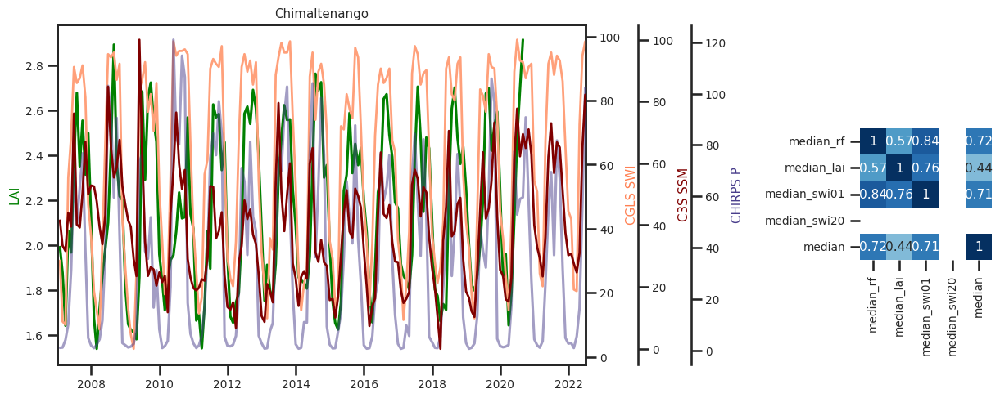

...

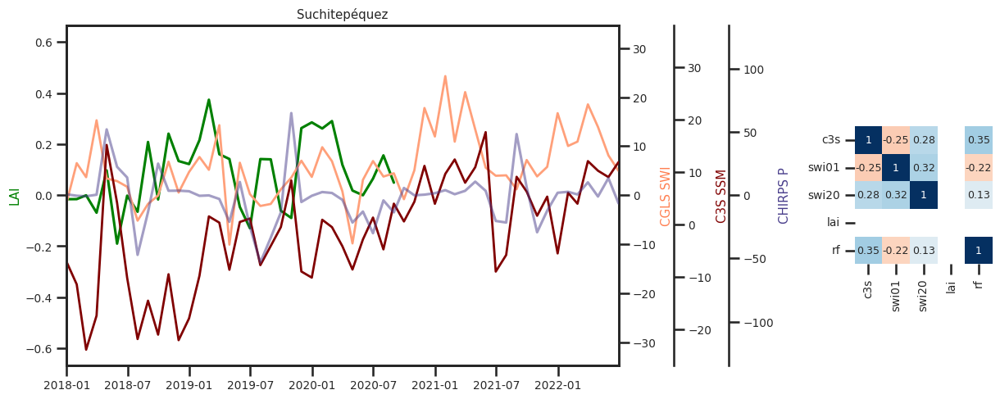

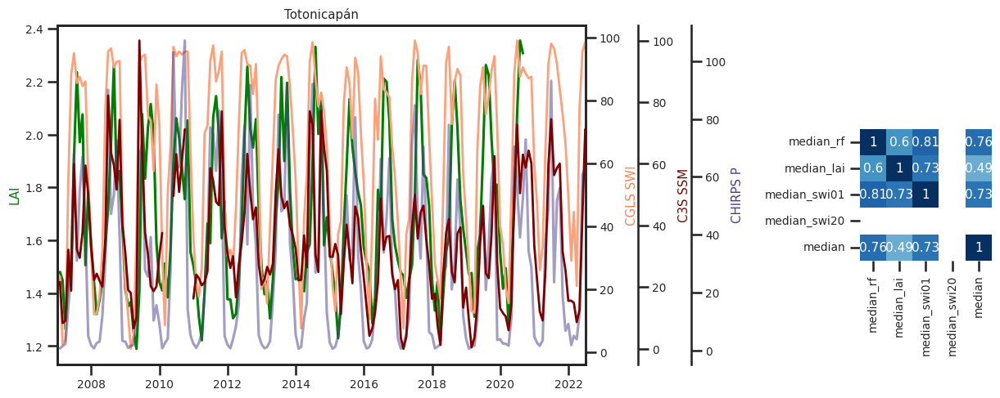

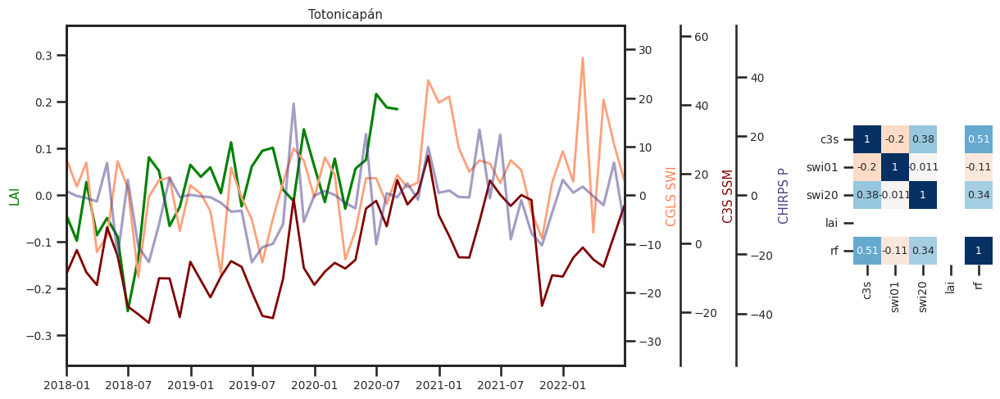

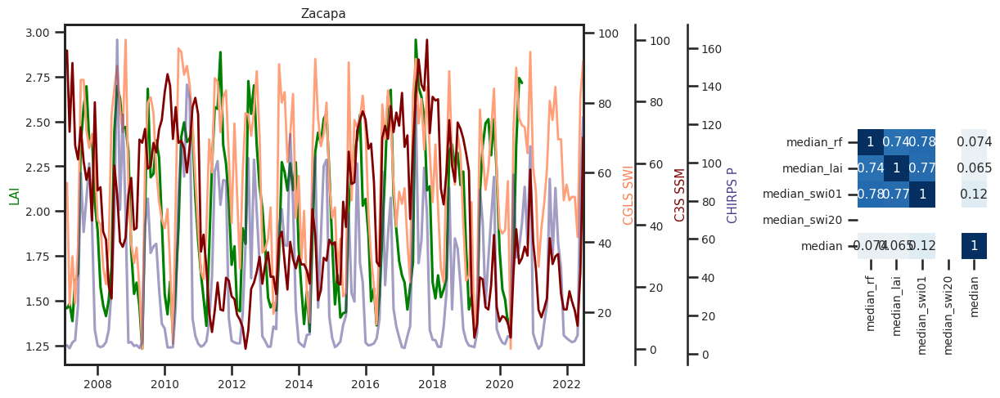

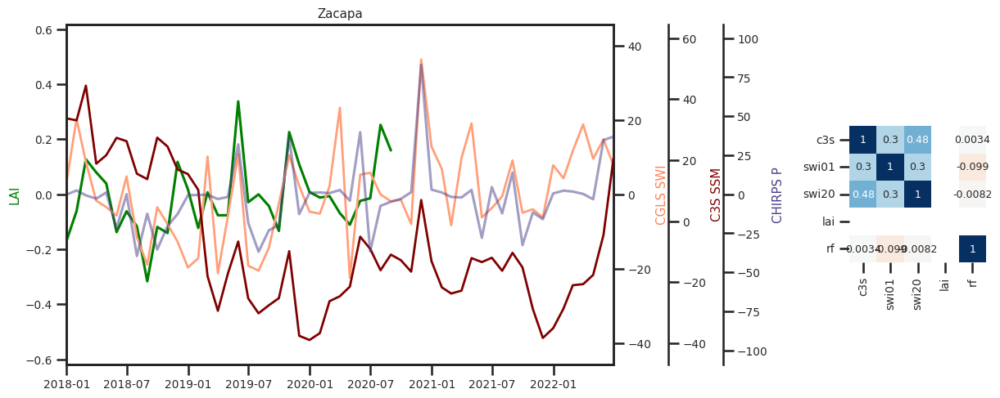

In [37]:
corrdf=pd.DataFrame(index=pd.MultiIndex.from_product([['c3s','swi01', 'swi20', 'lai','rf'],['c3s','swi01', 'swi20', 'lai','rf']]), columns=adm1_shapes.NAME_1.values)
acorrdf=pd.DataFrame(index=pd.MultiIndex.from_product([['ac3s','aswi01', 'aswi20', 'alai','arf'],['ac3s','aswi01', 'aswi20', 'alai','arf']]), columns=adm1_shapes.NAME_1.values)

sns.set(context='talk', style='ticks', font_scale=0.6)
for key, name in adm1_shapes.iterrows():
    data=df.xs(name.NAME_1, axis=1, level=1)
    data=data.resample('m').agg({'median_rf': np.cumsum, 'median_lai': np.mean,'median_swi01': np.mean,'median_swi20': np.mean, 'median':np.mean})
    data['median'] = ((data['median']-data['median'].min())/(data['median'].max()-data['median'].min()))*100
    skey = [x for x in data.keys() if x.startswith('median')]
      
    corr=data[skey].corr()
    corrdf.loc[:,name.NAME_1,]=corr.unstack().values
    _, (axb,corax) = plt.subplots(1,2, figsize=(12.333, 5),width_ratios=[4, 1])
    axa = axb.twinx()
    ax = axb.twinx()
    axc = axb.twinx()
    sns.heatmap(corr, cmap='RdBu', vmin=-1, vmax=1, annot=True, \
        annot_kws={'fontsize':11},\
       square=True, ax=corax, cbar=False)#xticklabels=['c3s','swi01', 'swi20','lai','rf'],yticklabels=['c3s','swi01', 'swi20','lai','rf'])
    ax.plot(data.median_rf, c='darkslateblue', alpha=0.5)
    axc.plot(data['median'], c='maroon', lw=2)
    axa.plot(data.median_swi01, c='lightsalmon', lw=2)
    axa.plot(data.median_swi20, c='coral', lw=2)
    axb.plot(data.median_lai, c='green')
    ax.set_ylabel('CHIRPS P', c='darkslateblue')
    axa.set_ylabel('CGLS SWI', c='coral')
    axc.set_ylabel('C3S SSM', c='maroon')
    axb.set_ylabel('LAI', c='green')
    ax.set_title(name.NAME_1)
    ax.spines.right.set_position(("axes", 1.2))
    axc.spines.right.set_position(("axes", 1.1))
    ax.set_xlim(datetime.datetime(2007, 1, 1), datetime.datetime(2022, 6, 30))
    plt.tight_layout()
    plt.savefig(os.path.join(data_path, 'TS_{:}.png'.format(name.NAME_1)), dpi=150)
    
    for var in skey:
        clim = tsa.calc_climatology(data[var], respect_leap_years=True, wraparound=True)
        data.loc[:, var+'_anom'] = tsa.calc_anomaly(data[var], climatology=clim, respect_leap_years=True)
    skey = [x for x in data.keys() if x.startswith('median') and x.endswith('_anom')]
    corr=data[skey].corr()
    acorrdf.loc[:,name.NAME_1]=corr.unstack().values
    _, (axb,corax) = plt.subplots(1,2, figsize=(12.333, 5),width_ratios=[4, 1])
    axa = axb.twinx()
    axc = axb.twinx()
    ax = axb.twinx()
    sns.heatmap(corr, cmap='RdBu', vmin=-1, vmax=1, annot=True, \
        annot_kws={'fontsize':9},\
       square=True, ax=corax, cbar=False,xticklabels=['c3s','swi01', 'swi20','lai','rf'],yticklabels=['c3s','swi01', 'swi20','lai','rf'])
    ax.plot(data.median_rf_anom, c='darkslateblue',alpha=0.5)
    axc.plot(data.median_anom, c='maroon', lw=2)
    axa.plot(data.median_swi01_anom, c='lightsalmon', lw=2)
    axa.plot(data.median_swi20_anom, c='coral', lw=2)
    axb.plot(data.median_lai_anom, c='green')
    ax.set_ylabel('CHIRPS P', c='darkslateblue')
    axa.set_ylabel('CGLS SWI', c='coral')
    axc.set_ylabel('C3S SSM', c='maroon')
    axb.set_ylabel('LAI', c='green')
    ax.set_title(name.NAME_1)
    for xx in [ax,axa, axb]:
        ylim=np.max(np.abs(xx.get_ybound()))
        xx.set_ylim(-ylim,ylim)
    axc.spines.right.set_position(("axes", 1.1))
    ax.spines.right.set_position(("axes", 1.2))
    ax.set_xlim(datetime.datetime(2018, 1, 1), datetime.datetime(2022, 6, 30))
    plt.tight_layout()
    plt.savefig(os.path.join(data_path, 'TSA_{:}.png'.format(name.NAME_1)), dpi=150)
    
    

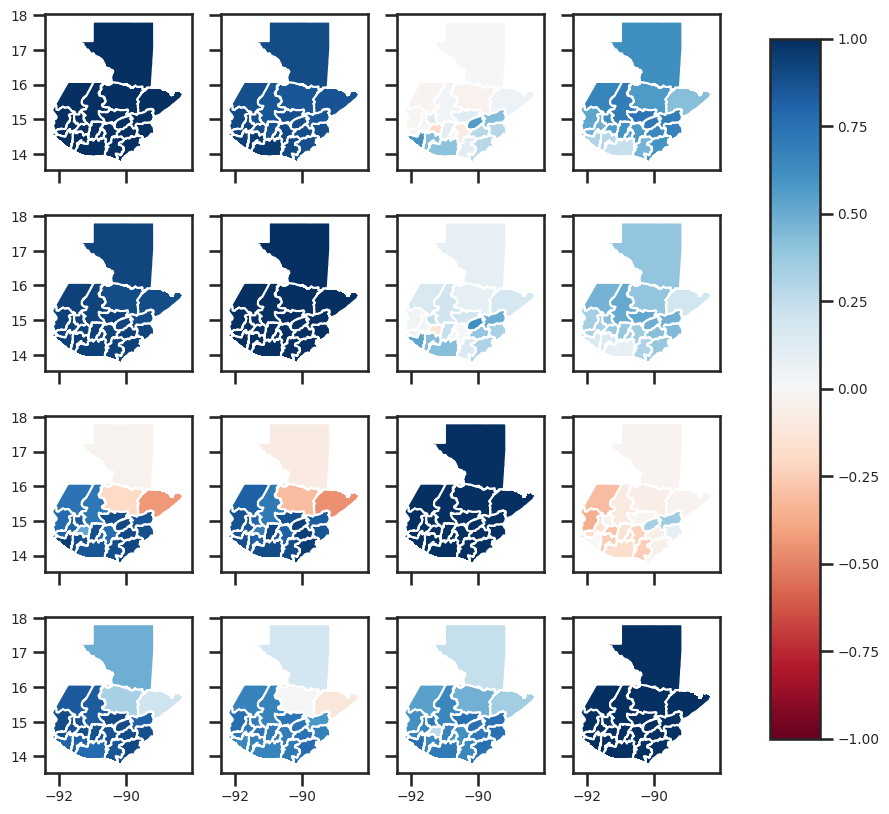

In [299]:
adm1_df=adm1_shapes.join(corrdf.transpose(),on='NAME_1').join(acorrdf.transpose(),on='NAME_1')
sns.set_style('white')
import matplotlib.colors as mcolors
norm = mcolors.Normalize(vmin=-1, vmax=1)
cbar = plt.cm.ScalarMappable(norm=norm, cmap='RdBu')

keys=[('aswi01', 'aswi01'), ('aswi01', 'aswi20'),('aswi01', 'alai'),    ('aswi01', 'arf'),
     ('swi01', 'swi20'), ('aswi20', 'aswi20'),('aswi20', 'alai'),    ('aswi20', 'arf'),
     ('swi01', 'lai'), ('swi20', 'lai'),('alai', 'alai'),    ( 'alai','arf'),
     ('swi01', 'rf'), ('swi20', 'rf'),('rf', 'lai'),    ('arf', 'arf')]
fig, axes = plt.subplots(4, 4,sharex=True, sharey=True,figsize=(10,10))
for key, ax in zip(keys,axes.flatten()):
    cax = divider.append_axes("right", size="5%", pad=0.1)

    sc=adm1_df.plot(column=key, ax=ax, vmin=-1, vmax=1,cmap='RdBu')
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(cbar, cax=cbar_ax)

# plt.savefig(os.path.join(plot_path, "pearson_r.png"), dpi=300)






In [ ]:
dates=[pd.date_range(end=datetime.datetime(2020, 6,30),periods=3,freq='m'),
                                                   pd.date_range(end=datetime.datetime(2020, 11,30),periods=3,freq='m'),
                                                   pd.date_range(end=datetime.datetime(2022, 6,30),periods=3,freq='m')]
datesl =[item for sublist in dates for item in sublist]
sdf=pd.DataFrame(index=pd.MultiIndex.from_product([datesl,['median_swi01', 'median_swi20','median_lai','median_rf']]),
                 columns=pd.MultiIndex.from_product([['smapi','qanom','zscore'],adm1_shapes.NAME_1.values]))


for key, name in adm1_shapes.iterrows():
    data=df.xs(name.NAME_1, axis=1, level=1)
    skey = [x for x in data.keys() if x.startswith('median')]
    for var in skey:
        dsa = pd.DataFrame(data[var]).rename({var:'abs'},axis=1)
        clim = tsa.calc_climatology(dsa['abs'], respect_leap_years=True, wraparound=True)
        dsa.loc[:, 'anom'] = tsa.calc_anomaly(dsa['abs'], climatology=clim, respect_leap_years=True)

        dsa.loc[:, 'month'] = dsa.index.month
        m_mean = dsa.groupby('month').mean()
        m_std = dsa.groupby('month').std()

        dsa = dsa.join(m_mean[['abs', 'anom']], on='month', how='left',rsuffix='_m')
        dsa = dsa.join(m_std[['abs', 'anom']], on='month', how='left',rsuffix='_std')
        data_m = dsa[['abs', 'anom', 'abs_m', 'abs_std', 'anom_m', 'anom_std']].resample('m').mean()
        data_m.loc[:,['smapi', 'smapi_mapped']] = smapi(data_m)
        data_m.loc[:,['zscore', 'zscore_mapped']] = zscore(data_m)
        data_m.loc[:,['qanom','qanom_mapped']] = qanom(data_m)
        for dt in datesl:
            sdf.loc[(dt,var),(['smapi','qanom','zscore'],name.NAME_1,)] = data_m.loc[dt,['smapi','qanom','zscore']].values

            

sns.set_style('white')
cdict = {'smapi':[[-100,-30,-15,-5, 5, 15,30,100],['extremely dry','moderately dry','dry','normal', 'wet', 'moderate wet','extremely wet']],
        'qanom':[[0,5,10,20,80,90,95],['extremely dry', 'moderate dry','dry','normal','wet','moderately wet','extremely wet']],
        'zscore':[[-5,-3,-2,-1,1,2,3,5],['extremely dry','moderately dry','dry','normal','wet','moderately wet','extremely wet']]}
vdict={"smapi":[-75,75],'qanom':[0,100],'zscore':[-5,5]}
cmap=mpl.cm.RdBu
from mpl_toolkits.axes_grid1 import make_axes_locatable
for indi in ['smapi','qanom','zscore']:
    bounds = cdict[indi][0]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    cbar=plt.cm.ScalarMappable(norm=norm, cmap='RdBu')
    for dt in dates:
        adm1_df=adm1_shapes.join(sdf.loc[dt].transpose().loc[indi],on='NAME_1')
        fig, axes = plt.subplots(3,4,sharex=True, sharey=True,figsize=(12,10))
        plt.suptitle(indi+': '+dt[2].strftime('%Y %B'),y=0.93)
        for key, ax in zip(adm1_df.keys()[-12:],axes.flatten()):
            try:
                sc=adm1_df.plot(column=key, ax=ax, cmap=cmap, norm=norm,vmin=vdict[indi][0],vmax=vdict[indi][1])
                ax.set_title(key)
            except:
                continue
        fig.subplots_adjust(bottom=0.15)
        cbar_ax = fig.add_axes([axes[2][0].get_position().x0, axes.flatten()[-1].get_position().y0-0.1,  axes[3][2].get_position().x1-axes[0][0].get_position().x0,0.02])
        fig.colorbar(cbar, cax=cbar_ax,orientation='horizontal')
#         fig.subplots_adjust(right=0.8)
#         cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#         fig.colorbar(cbar, cax=cbar_ax)
        plt.savefig('/home/mavl/ESMCA/{:}_{:}.png'.format(indi,dt[2].strftime('%Y%m')), dpi=150)

In [465]:
adm1_df.keys()[-9:]

Index([   (2022-04-30 00:00:00, 'median_rf'),
       (2022-05-31 00:00:00, 'median_swi01'),
       (2022-05-31 00:00:00, 'median_swi20'),
         (2022-05-31 00:00:00, 'median_lai'),
          (2022-05-31 00:00:00, 'median_rf'),
       (2022-06-30 00:00:00, 'median_swi01'),
       (2022-06-30 00:00:00, 'median_swi20'),
         (2022-06-30 00:00:00, 'median_lai'),
          (2022-06-30 00:00:00, 'median_rf')],
      dtype='object')

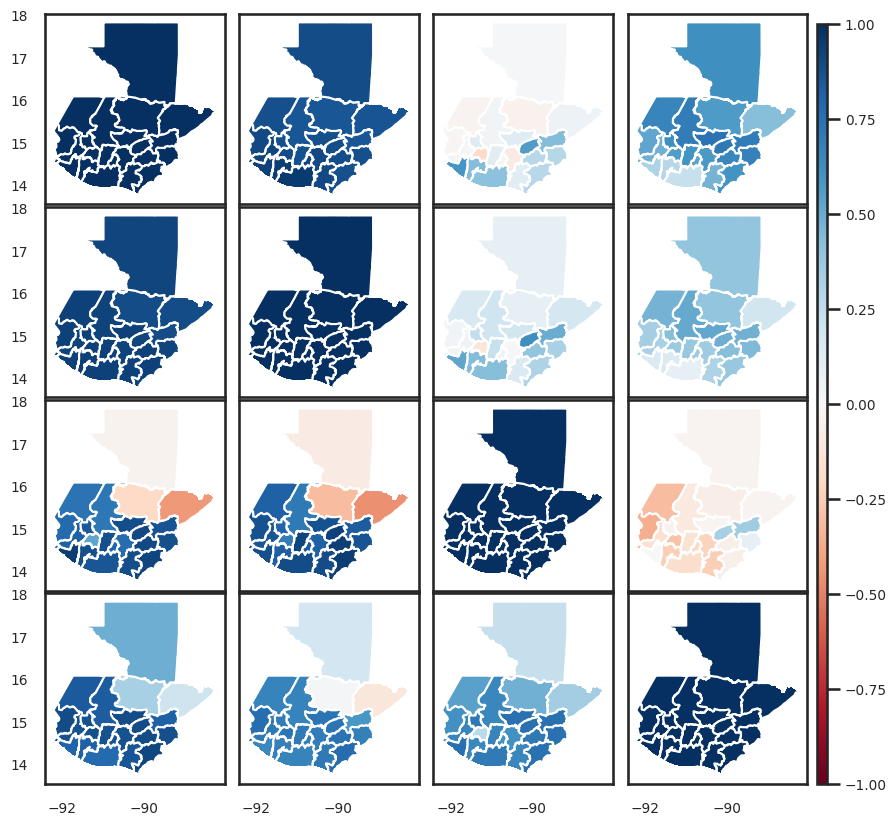

In [410]:
adm1_df=adm1_shapes.join(corrdf.transpose(),on='NAME_1').join(acorrdf.transpose(),on='NAME_1')
sns.set_style('white')
import matplotlib.colors as mcolors
norm = mcolors.Normalize(vmin=-1, vmax=1)
cbar = plt.cm.ScalarMappable(norm=norm, cmap='RdBu')

from mpl_toolkits.axes_grid1 import make_axes_locatable
keys=[('aswi01', 'aswi01'), ('aswi01', 'aswi20'),('aswi01', 'alai'),    ('aswi01', 'arf'),
     ('swi01', 'swi20'), ('aswi20', 'aswi20'),('aswi20', 'alai'),    ('aswi20', 'arf'),
     ('swi01', 'lai'), ('swi20', 'lai'),('alai', 'alai'),    ( 'alai','arf'),
     ('swi01', 'rf'), ('swi20', 'rf'),('rf', 'lai'),    ('arf', 'arf')]
fig, axes = plt.subplots(4, 4,sharex=True, sharey=True,figsize=(10,10))
for key, ax in zip(keys,axes.flatten()):
    cax = divider.append_axes("right", size="5%", pad=0.1)

    sc=adm1_df.plot(column=key, ax=ax, vmin=-1, vmax=1,cmap='RdBu')
fig.subplots_adjust(right=0.9,wspace=0.01, hspace=0.0125)
cbar_ax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.01, axes[0][0].get_position().y1-ax.get_position().y0])
fig.colorbar(cbar, cax=cbar_ax)
plt.savefig('/home/mavl/ESMCA/corr_map.png', dpi=150)

In [453]:
pd.DataFrame(index=pd.MultiIndex.from_product([datesl,['median_swi01', 'median_swi20','median_lai','median_rf']]),
                 columns=pd.MultiIndex.from_product([['smapi','qanom','zscore'],adm1_shapes.NAME_1.values]))

smapi                                        \
                        Alta Verapaz Baja Verapaz Chimaltenango Chiquimula   
2020-04-30 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2020-05-31 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2020-06-30 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2020-09-30 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2020-10-31 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2020-11-30 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2022-04-30 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2022-05-31 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   
2022-06-30 median_swi01          NaN          NaN           NaN        NaN   
           median_swi20          NaN          NaN           NaN        NaN   
           median_lai            NaN          NaN           NaN        NaN   
           median_rf             NaN          NaN           NaN        NaN   

                                                                              \
                        El Progreso Escuintla Guatemala Huehuetenango Izabal   
2020-04-30 median_swi01         NaN       NaN       NaN           NaN    NaN   
           median_swi20         NaN       NaN       NaN           NaN    NaN   
           median_lai           NaN       NaN       NaN           NaN    NaN   
           median_rf            NaN       NaN       NaN           NaN    NaN   
2020-05-31 median_swi01         NaN       NaN       NaN           NaN    NaN   
           median_swi20         NaN       NaN       NaN           NaN    NaN   
           median_lai           NaN       NaN       NaN           NaN    NaN   
           median_rf            NaN       NaN       NaN           NaN    NaN   
2020-06-30 median_swi01         NaN       NaN       NaN           NaN    NaN   
           median_swi20         NaN       NaN       NaN           NaN    NaN   
           median_lai           NaN       NaN       NaN           NaN    NaN   
           median_rf      